### Edoardo Gamurrini

# Particles in a box, version 4


In this assignment, we want you to code, in 2D, the elastic collision of  𝑁=𝑁𝐴+𝑁𝐵  particles, modeled as circular disks of a given radius, confined inside a strip.

The strip is rectangular, with a size  8  in the horizontal  𝑋  direction, and  16  in the vertical  𝑌  direction.

A constant gravity field acts on the particles, directed along the (negative) vertical  𝑌  direction.

## Collisions with the box walls

The collisions with the four internal sides of the box are *elastic*, namely conserve energy: this simply means that in the collision the component of the particle velocity **parallel** to a box side is unchanged, whereas the component **perpendicolar** to the box side is reversed.

## Collisions between particles

Also collisions between the particles are elastic, but require a more complicated treatment.

We assume that there are **two** kind of particles, in fact discs having _all_ the same given radius $R$, but with different masses $M_A, M_B$.

Using conservation of energy and momentum, it is possible to show that if two particles have velocities $\vec{v}_1$ and $\vec{v}_2$ at the time of the collision, and if $\vec{r}_{rel} = \vec{r}_1 - \vec{r}_2$ is the relative position of the two particles' centers, and $\vec{v}_{rel} = \vec{v}_1 - \vec{v}_2$ is the relative velocity before the collision, then after the collision one has *new* velocities

\begin{eqnarray}
\vec{v}^\prime_1 &=& \vec{v}_1 - \frac{2 M_2}{M_1 + M_2}\frac{\left(\vec{v}_{rel}\cdot\vec{r}_{rel}\right)}{\left(\vec{r}_{rel}\cdot\vec{r}_{rel}\right)}\vec{r}_{rel}\nonumber\\
\vec{v}^\prime_2 &=& \vec{v}_2 + \frac{2 M_1}{M_1 + M_2}\frac{\left(\vec{v}_{rel}\cdot\vec{r}_{rel}\right)}{\left(\vec{r}_{rel}\cdot\vec{r}_{rel}\right)}\vec{r}_{rel}
\end{eqnarray}

where $\left(\vec{a}\cdot\vec{b}\right)\equiv a_x b_x + a_y b_y$ is the usual scalar (or *dot*) product of vectors.

These formulas reflect the fact that the colliding disks repel each other along the direction which joins their centers. The formulas are valid for arbitrary masses $M_1, M_2$, and of course simplify a bit for those collisions involving particles with equal mass.

**Note**: in principle one could have also three particle collisions, but at low particle densities they are rare and can be disregarded.

## Energy considerations

In the real world, energy is conserved; this means that, if one defines the gravitational potential energy

\begin{equation}
U_i = M_i g y_i
\end{equation}

of particle $i$, where $y_i$ is the distance of the particle from the bottom of the box, and the kinetic energy

\begin{equation}
K_i = \frac{1}{2} M_i v_i^2 = \frac{1}{2} M_i \left(\vec{v}_i\cdot\vec{v}_i\right)
\end{equation}

the *sum* of these quantities, called mechanical energy, over *all* particles is constant in time.
Or equivalently, the average mechanical energy per particle is constant.

This conservation will be violated because of numerical errors: the actual behaviour will depend **both** on the integration step $\Delta t$ and on the chosen integration method.

Energy will not be constant, and one of the goals of this assignment is to see how it varies.

## Coding assignment

Write structured code, or a class, to perform the following tasks:

* **INITIALIZATION** Assume that particles are confined in a box with a size $8$ in the horizontal $X$ direction, and $16$ in the vertical $Y$ direction. Inside the box, place initially $N_A = 30$ particles with mass $M_A = 0.025$, and $N_B = 30$ particles with mass $M_B = 0.05$. Assume for all particles the _same_ radius $R = 0.04$. Place the particles at random positions in the box, with the additional limit $y\leq 8$, and with a random velocity vector, uniformly distributed in the interval $[-v_0, v_0]$, for each velocity component. You will have to experiment a bit with the parameter $v_0$; start for instance with $v_0=0.5$. Write the code so that you can specify also the initial seed and repeat the simulation, if needed, starting with the same initial conditions.
* **EVOLUTION & MEASUREMENT** Simulate the motion of the particles under the effect of gravity, namely under a constant _down_ acceleration $g = 9.81$, subject to collisions with the box walls and among the particles. You will want:
    * to evolve the position of the particles, step by step, for a total time $T$ with time steps $\Delta t$, hence for $N=T/\Delta t$ steps. Note that the motion of a particle in a constant gravity field can be written exactly, so at each step one has simply, for a given particle
    \begin{eqnarray}
    x(t+\Delta t) &=& x(t) + v_x(t) \Delta t\\
    y(t+\Delta t) &=& y(t) + v_y(t) \Delta t - \frac{1}{2} g (\Delta t)^2\\
    v_x(t+\Delta t) &=& v_x(t)\\
    v_y(t+\Delta t) &=& v_y(t) - g \Delta t
    \end{eqnarray}
    * after each update of particles' positions, check for collisions with the box sides, and among particles, and apply appropriate changes to the velocities, as explained before.
    * At a sampling step $\Delta t_s$, in general a multiple of $\Delta t$, please measure the following quantities:
        * The positions and velocities of all particles, to be stored in appropriate arrays. As an example if $N_s = \frac{T}{\Delta t_s}$ is the number of samples, one will need an array $N_s\times N_A\times 2$ to store the $2$ components of the position for $N_A$ particles of the species $A$ for $N_S$ samples.
        * The average kinetic energy of the particles' species $A$:
         \begin{equation}
         \langle K_A\rangle =\frac{1}{2 N_A} M_A\sum_{i=1}^{N_A} (\vec{v}_i\cdot\vec{v}_i)
         \end{equation}
         (which will require an array of size $N_s$).
        * The average kinetic energy of the particles' species $B$:
        \begin{equation}
        \langle K_B\rangle =\frac{1}{2 N_B} M_B\sum_{i=1}^{N_B} (\vec{v}_i\cdot\vec{v}_i)
        \end{equation}
        * The average potential energy of the particles' species $A$:
        \begin{equation}
        \langle U_A\rangle = \frac{1}{N_A} M_A g \sum_{i=1}^{N_A} y_i
        \end{equation}
        * The average potential energy of the particles' species $B$:
        \begin{equation}
        \langle U_B\rangle = \frac{1}{N_B} M_B g \sum_{i=1}^{N_B} y_i
        \end{equation}
* **VISUALISATION**
    * Plot the average energies, saved in arrays during the measurement phase, as a function of time.
    * Plot the positions and velocities of all particles (and the box walls) at several times, using the `matplotlib` method `quiver` to display also the velocities (properly rescaled), and using different colors for the two particle species. I suggest to make these plots a few times: at beginning and end of the simulation, and at several times (say 10) during the evolution, to check what is going on.
    * Animate the motion of all particles over the measurement time. Use one of the many examples provided during the lessons, based on the `animate` function from the `Matplotlib`. Since you have already saved the positions of the particles at all measurement steps in arrays, it remains only to reuse the data, first setting up the graphical structures and then calling repeatedly a function which picks the appropriate elements from the saved arrays in order to update the position of the particles.

## Simulation assignments

### Energy evolution

* To debug the code, check how the energy evolves. Repeat the simulation over a time interval $T = 100 s$, with different $\Delta t$ simulation steps, say $0.004,\; 0.002,\; 0.001$, and for the same sampling step $\Delta t_s = 0.04$, and compare the plots of the *total* energy $E_{tot}$ (kinetic + potential) as a function of time
\begin{equation}
E_{tot} = N_A \left(\langle K_A\rangle +\langle U_A\rangle\right) + N_B \left(\langle K_B\rangle +\langle U_B\rangle\right)
\end{equation}
if the simulation is correct, the total energy $E_{tot}$ should be *approximately* constant, and things should get better with smaller $\Delta t$.
* Using the smallest $\Delta t$ simulation step, plot now the *average* kinetic energy for each species $\langle K_A\rangle, \langle K_B\rangle$
as a function of time. 

If the simulation is correct, the average kinetic energies for the two species, even though different at the beginning, should tend to become equal as time passes: this is an example of the *equipartition theorem*.

If $T=100 s$ is insufficient to achieve equilibrium, please increase $T$. Check at which time (call it $T_{therm}$) the system has reached an equilibrium, for instance requiring that the two kinetic energies are equal within $10\%$.

Check what happens trying different values of the parameter $v_0$: does the time needed to achieve equilibrium change? Is equilibrium achieved, in the first place?

**Please note** the speed $v$ should be chosen _small_ with respect to the ratio $\frac{R}{\Delta t}$ of the size of the disks and the simulation step: otherwise, the detection of the collision will be inaccurate. Depending, therefore, on the values of velocity $v$ that can be reached, you may have to adjust $\Delta t$.
As an estimate, consider that a particle having initial velocity $v_0$ and falling from an height $L$ will achieve a speed $v_{max}=v_0 + \sqrt{2 g L}$.

- Ogni particella possiede una massa, una forma e una velocità composte da 2 componenti (orizzontali e verticali):
    
        - Il raggio è uguale per tutte le particelle nella scatola;
        - La forma è uguale per tutte le particelle nella scatola rappresentata come cerchio di raggio costante;
        - Sono presenti 2 masse differenti MA, MB;
        - La velocità iniziale è inizializzata con un numero casuale nel range [-0.5, 0.5];
        
- Esistono due tipi di collisioni nello scenario:

        - Collisioni delle particelle contro le pareti del box;
        - Collisioni delle particelle tra le stesse; 

- Ogni particella è caratterizzata da una Eki e una Ui corrispondenti alla Energia Cinetica e potenziale.

- Ogni particella in movimento nella scatola è attratta verso il basso a causa dell'esistenza della forza di gravità;





        

# Importazione Librerie
In questa sezione ho importato varie librerie di cui ho bisogno per costruire la simulazione

In [1]:
from matplotlib import pyplot as plt        #questa libreria consente di creare grafici di cui abbiamo bisogno
import random as rnd                        #random Libreria random per inizializzare valori di ciascuna particella
import numpy as np                          #numpy Libreria usata per creare e manipolare matrici 
import math                                 #math Libreria che ci offre di svolgere operazioni matematiche
                                       
from matplotlib import animation            #Librerie per eseguire l'animazione della simulazione
from IPython.display import HTML

# Definizione Variabili
Per il seguente progetto ho scelto di rappresentare le particella i-esima una matrice in 3 dimensioni.
La prima dimensione rappresenta l'id di ogni particella, la seconda dimensione rappresenta il tempo t in cui consideriamo la particella e la terza dimensione rappresenta vari campi che descrivono vari aspetti fisici come:

        - [0] La posizione x;
        - [1] La posizione y;
        - [2] Componente x della velocità;
        - [3] Componente y della velocità;
        - [4] Velocità relativa data dal teorema di Pitagora;
        - [5] Energia Cinetica della particella;
        - [6] Energia Potenziale della particella;
        
Ho scelto di usare due variabili dimBoxX e dimBoxY per permettere all'utente di settare la lunghezza e larghezza della scatola.


In [2]:
numeroPartA = 30;                  # Numero di particelle A
numeroPartB = 30;                  # Numero di particelle B

massaPartA = 0.025;                # Massa particelle tipo A
massaPartB = 0.05;                 # Massa particelle tipo B

raggioPart = 0.04;                 # Raggio delle particelle
intervalloVel = [-0.5, 0.5];       # Intervallo della velocità che può assumere una particella
gravita = 9.81;                    # Accelerazione di gravità
T = 100;                           # Periodo 
dti = 0.04;                        # Tempo
campioniPerdt = int(T/dti)+1;      # Numero di campioni in T per dt
dimBoxX = 8;                       # Dimensione x del Box 
dimBoxY = 16;                      # Dimensione y del Box 

# Creazione di una matrice tridimensionale per ogni tipo di particella (A, B) contenente 7 campi: x, y, vx, vy, v, Ek, Ui
particelleA = np.zeros((numeroPartA ,campioniPerdt,7),'d');
particelleB = np.zeros((numeroPartB ,campioniPerdt,7),'d');

particelleA1 = np.zeros((numeroPartA ,campioniPerdt,7),'d');
particelleB1 = np.zeros((numeroPartB ,campioniPerdt,7),'d');


# Definizioni di Funzioni
In questa sezione si definiscono e si spiegano molte delle funzioni che ci serviranno per far si che la simulazione funzioni.

        - generatoreNumCas
        - velocita
        - EnergiaCinetica
        - EnergiaPotenziale
        - InizializzazioneParticelle
        - DistanzaParticelle
        - inizializzoPlotPosizione
        - DisegnaTutteParticelleIstanti
        - CollisioneConParticelleEBordi
        - InizializzoVettoreAnimazione
        - animazione 
    
        

In [3]:
# Funzione che restituisce un numero random in un intervallo tra due valori
def generatoreNumCas(n1, n2):
    # restituisco un valore casuale di una distribuzione uniforme tra n1, n2
    return rnd.uniform(n1, n2);

# Dando i due valori delle velocità(velX, velY), calcola la velocità (v) usando il teorema di pitagora
def velocita(velX, velY):
    return math.sqrt(velX**2+velY**2);

# Calcola e restituisce l'energia cinetica di una particella passandogli anche la massa
def EnergiaCinetica(velocitaX, velocitaY, massa):
    return(0.5 * velocita(velocitaX, velocitaY)**2) * massa;

# Calcola e restituisce l'energia potenziale di una particella
def EnergiaPotenziale(altezza, massa):
    return massa * gravita * altezza;

# Funzione per inizializzare tutti i campi delle particelle
def InizializzazioneParticelle(particelleA, particelleB, numeroA, numeroB, massaA, massaB):
    for i in range(numeroA): # ripeti per il numero di particelle di tipo A
        particelleA[i][0][0] = generatoreNumCas(raggioPart, dimBoxX - raggioPart);       # posizione x
        particelleA[i][0][1] = generatoreNumCas(raggioPart, dimBoxY/2);                  # posizione y
        particelleA[i][0][2] = generatoreNumCas(intervalloVel[0], intervalloVel[1]);     # componente x velocità
        particelleA[i][0][3] = generatoreNumCas(intervalloVel[0], intervalloVel[1]);     # componente y velocità
        particelleA[i][0][4] = velocita(particelleA[i][0][2], particelleA[i][0][3]);     # Velocità relativa data dal teorema di Pitagora
        particelleA[i][0][5] = EnergiaCinetica(particelleA[i][0][2], particelleA[i][0][3], massaA);   # Energia cinetica 
        particelleA[i][0][6] = EnergiaPotenziale(particelleA[i][0][1], massaA);          # Energia Potenziale
        
    for i in range(numeroB): # ripeti per il numero di particelle di tipo B
        particelleB[i][0][0] = generatoreNumCas(raggioPart, dimBoxX - raggioPart);       # posizione x
        particelleB[i][0][1] = generatoreNumCas(raggioPart, dimBoxY/2);                  # posizione y
        particelleB[i][0][2] = generatoreNumCas(intervalloVel[0], intervalloVel[1]);     # componente x velocità
        particelleB[i][0][3] = generatoreNumCas(intervalloVel[0], intervalloVel[1]);     # componente y velocità
        particelleB[i][0][4] = velocita(particelleB[i][0][2], particelleB[i][0][3]);     # Velocità relativa data dal teorema di Pitagora
        particelleB[i][0][5] = EnergiaCinetica(particelleB[i][0][2], particelleB[i][0][3], massaA);   # Energia cinetica 
        particelleB[i][0][6] = EnergiaPotenziale(particelleB[i][0][1], massaB);          # Energia Potenziale

# Funzione che calcola la distanza tra due particelle 
def DistanzaParticelle(particella1, particella2, t):
    return math.sqrt(((particella1[t][0] - particella2[t][0])**2) + ((particella1[t][1] - particella2[t][1])**2));


# Inizializzo la figura con posizione iniziale 
def inizializzoPlotPosizione():
    plt.figure(figsize=(8,16));
    plt.ylabel("Posizione Y");
    plt.xlabel("Posizione X");

    plt.xlim(-1,dimBoxX+1);
    plt.ylim(-1,dimBoxY+1);

# Funzione per stampare tutte le particelle con i relativi vettori 
# velocità per 10 istanti di tempo considerando il primo e l ultimo
def DisegnaTutteParticelleIstanti(particelleA1, particelleB1):
    for i in range(0, 2501, 250):
        inizializzoPlotPosizione();
        for p in particelleA1:
            plt.plot(p[i][0], p[i][1],'bo')
            plt.quiver(p[i][0], p[i][1], p[i][2], p[i][3])  #stampa dei vettori velocità particelleA

        for p in particelleB1:
            plt.plot(p[i][0], p[i][1],'ro')
            plt.quiver(p[i][0], p[i][1], p[i][2], p[i][3])  #stampa dei vettori velocità particelleB
        
        plt.title(f"istante di tempo: {i}");
        plt.show();

# Funzione che controlla le collisioni tra particelle
# e con i bordi della box ed avanza per un istante di tempo
def CollisioneConParticelleEBordi(particellaA, particellaB, massaA, massaB, k, dt):    
    # Shift di tutte le misurazioni delle particelle A dal tempo t-1 al tempo t
    for pa in particellaA:
        for t in range(1, campioniPerdt):
            pa[t] = pa[t-1]
            
    # Shift di tutte le misurazioni delle particelle B dal tempo t-1 al tempo t
    for pb in particellaB:
        for t in range(1, campioniPerdt):
            pb[t] = pb[t-1]
    
    # Prendo i dati relativi alle particelle A dall'animazione e li 
    #copio in una nuova struttura dati particelleA1
    for n in range(0, numeroPartA):
        particelleA1[n][k][0] = particelleA[n][k][0]
        particelleA1[n][k][1] = particelleA[n][k][1]
        particelleA1[n][k][2] = particelleA[n][k][2]
        particelleA1[n][k][3] = particelleA[n][k][3]
            
    # Prendo i dati relativi alle particelle A dall'animazione e li 
    #copio in una nuova struttura dati particelleB1
    for n in range(0, numeroPartB):
        particelleB1[n][k][0] = particelleB[n][k][0]
        particelleB1[n][k][1] = particelleB[n][k][1]
        particelleB1[n][k][2] = particelleB[n][k][2]
        particelleB1[n][k][3] = particelleB[n][k][3]
    
    
    # Resetto Valore di tempo piu recente delle particelle da esaminare 
    t = 0    

    # Ora controlliamo la collisione tra le particelle
    # Quando due particelle collidono bisognerà applicare le formule 
    # delle velocita V1 e V2 riportate nella specifica
    for n1 in range(0, numeroPartA):
        for n2 in range(0, numeroPartA):
            # Controllo la distanza tra le particelle, controllando che non stia controllando la stessa particella 
            #con se stessa e se si scontrano applico la formula come spiegato precedentemente.
            # entrambe particelleA
            if (DistanzaParticelle(particellaA[n1], particellaA[n2], t) <= (raggioPart * 2) and n1 != n2):
                Rrelx = particellaA[n1][t][0] - particellaA[n2][t][0] 
                Rrely = particellaA[n1][t][1] - particellaA[n2][t][1]
                Vrelx = particellaA[n1][t][2] - particellaA[n2][t][2]
                Vrely = particellaA[n1][t][3] - particellaA[n2][t][3]
                k = ((Vrelx * Rrelx) + (Vrely * Rrely)) / ((Rrelx** 2 )+ (Rrely ** 2 ))
                
                particellaA[n1][t][2] = particellaA[n1][t][2] - (k * Rrelx)
                particellaA[n1][t][3] = particellaA[n1][t][3] - (k * Rrely)
                particellaA[n2][t][2] = particellaA[n2][t][2] + (k * Rrelx)
                particellaA[n2][t][3] = particellaA[n2][t][3] + (k * Rrely)

                
    for pa in particellaA:
        for pb in particellaB:
            # Controllo la distanza tra le particelle e se si scontrano applico la formula 
            # come spiegato precedentemente.
            # una particellaA e una particellaB
            if (DistanzaParticelle(pa, pb, t) <= (raggioPart * 2)):
                Rrelx = pa[t][0] - pb[t][0] 
                Rrely = pa[t][1] - pb[t][1]
                Vrelx = pa[t][2] - pb[t][2]
                Vrely = pa[t][3] - pb[t][3]
                k = ((Vrelx * Rrelx) + (Vrely * Rrely)) / ((Rrelx** 2 )+ (Rrely ** 2 ))
                
                pa[t][2] = pa[t][2] - (2 * massaPartB / (massaPartB + massaPartA)) * (k * Rrelx)
                pa[t][3] = pa[t][3] - (2 * massaPartB / (massaPartB + massaPartA)) * (k * Rrely)
                pb[t][2] = pb[t][2] + (2 * massaPartA / (massaPartB + massaPartA)) * (k * Rrelx)
                pb[t][3] = pb[t][3] + (2 * massaPartA / (massaPartB + massaPartA)) * (k * Rrely)
                
    for p1 in range(0, numeroPartB):
        for p2 in range(0, numeroPartB):
            # Controllo la distanza tra le particelle, controllando che non stia controllando la stessa particella 
            #con se stessa e se si scontrano applico la formula come spiegato precedentemente.
            # entrambe particelleB
            if (DistanzaParticelle(particellaB[p1], particellaB[p2], t) <= (raggioPart * 2) and p1 != p2):
                Rrelx = particellaB[p1][t][0] - particellaB[p2][t][0] 
                Rrely = particellaB[p1][t][1] - particellaB[p2][t][1]
                Vrelx = particellaB[p1][t][2] - particellaB[p2][t][2]
                Vrely = particellaB[p1][t][3] - particellaB[p2][t][3]
                k = ((Vrelx * Rrelx) + (Vrely * Rrely)) / ((Rrelx** 2 )+ (Rrely ** 2 ))
                
                particellaB[p1][t][2] = particellaB[p1][t][2] - (k * Rrelx)
                particellaB[p1][t][3] = particellaB[p1][t][3] - (k * Rrely)
                particellaB[p2][t][2] = particellaB[p2][t][2] + (k * Rrelx)
                particellaB[p2][t][3] = particellaB[p2][t][3] + (k * Rrely)            
    
    # Per particella di tipo A
    for pa in particellaA:      
        # Controllo le collisioni al limite del box lungo l'asse Y a sinistra
        if ((pa[t][0] - raggioPart) <= 0):
            # inverto la velocità x
            pa[t][2] = - pa[t][2] 
            # nuova posizione se tocca la scatola
            pa[t][0] = 0 + raggioPart
            
        # Controllo le collisioni al limite del box lungo l'asse Y a destra
        if ((pa[t][0] + raggioPart) >= dimBoxX):
            # inverto la velocità x
            pa[t][2] = - pa[t][2]
            # nuova posizione se tocca la scatola
            pa[t][0] = dimBoxX - raggioPart


        # Controllo le collisioni al limite del box lungo l'asse X in basso
        if ((pa[t][1]) - raggioPart <= 0):
            # inverto la velocità y
            pa[t][3] = - pa[t][3]
            # nuova posizione se tocca la scatola
            pa[t][1] = 0 + raggioPart
            
        # Controllo le collisioni al limite del box lungo l'asse X in alto
        if ((pa[t][1]) + raggioPart >= dimBoxY): 
            # inverto la velocità y
            pa[t][3] = - pa[t][3]
            # nuova posizione se tocca la scatola
            pa[t][1] = dimBoxY - raggioPart
            
        # movimento della particella a
        pa[t][0] = pa[t][0] + pa[t][2] * dt                           # Aggiorno x = x0 + vx * dt
        pa[t][1] = pa[t][1] + (pa[t][3] * dt) - (gravita * dt**2)/2   # Aggiorno y = y0 + v0y * dt - 1/2 *g * dt^2
        pa[t][3] = pa[t][3] - (gravita * dt)                          # Aggiorno vy = v0y - g * dt
        pa[t][5] = EnergiaCinetica(pa[t][2], pa[t][3], massaA)        # Aggiorno energia cinetica
        pa[t][6] = EnergiaPotenziale(pa[t][1], massaA)                # Aggiorno energia potenziale

    # Per particella di tipo B
    for pb in particellaB:
        # Controllo le collisioni al limite del box lungo l'asse Y a sinistra
        if ((pb[t][0] - raggioPart) <= 0):
            
            # inverto la velocità x
            pb[t][2] = - pb[t][2] 
            # nuova posizione se tocca la scatola
            pb[t][0] = 0 + raggioPart
            
        # Controllo le collisioni al limite del box lungo l'asse Y a destra   
        if ((pb[t][0] + raggioPart) >= dimBoxX):
            
            # inverto la velocità x
            pb[t][2] = - pb[t][2] 
            # nuova posizione se tocca la scatola
            pb[t][0] = dimBoxX - raggioPart


        # Controllo le collisioni al limite del box lungo l'asse X in basso
        if ((pb[t][1]) - raggioPart <= 0):
             # inverto la velocità y
            pb[t][3] = - pb[t][3] 
            # riassegno posizione 
            pb[t][1] = 0 + raggioPart
            
        # Controllo le collisioni al limite del box lungo l'asse X in alto    
        if ((pb[t][1]) + raggioPart >= dimBoxY): 

            # inverto la velocità y
            pb[t][3] = - pb[t][3] 
            # riassegno posizione 
            pb[t][1] = dimBoxY - raggioPart
            
        
        # movimento della particella b
        pb[t][0] = pb[t][0] + pb[t][2] * dt                           # Aggiorno x = x0 + vx * dt
        pb[t][1] = pb[t][1] + (pb[t][3] * dt) - (gravita * dt**2)/2   # Aggiorno y = y0 + v0y * dt - 1/2 *g * dt^2
        pb[t][3] = pb[t][3] - (gravita * dt)                          # Aggiorno vy = v0y - g * dt
        pb[t][5] = EnergiaCinetica(pb[t][2], pb[t][3], massaB)        # Aggiorno energia cinetica
        pb[t][6] = EnergiaPotenziale(pb[t][1], massaB)                # Aggiorno energia potenziale 

# Inizializzo vettore per animazione
def InizializzoVettoreAnimazione(particelle, t):
    animazioneVettore = np.zeros((60+1,2), 'd') # Crea un vettore che tiene traccia delle x e y per simulare il moto
    i = 0;
    for j in range(0, numeroPartA-1):
        animazioneVettore[i][0] = particelle[j][t][0]
        animazioneVettore[i][1] = particelle[j][t][1]
        i += 1;
    return animazioneVettore

        
# Funzione che inizializza la simulazione
def animazione(t):
    CollisioneConParticelleEBordi(particelleA, particelleB, 0.025, 0.05, t, dti);

    vettoreA = InizializzoVettoreAnimazione(particelleA, numeroPartA)
    vettoreB = InizializzoVettoreAnimazione(particelleB, numeroPartB)
    
    linea.set_data(vettoreA[:,0],vettoreA[:,1]) 
    linea2.set_data(vettoreB[:,0],vettoreB[:,1]) 
 

# INIZIO SIMULAZIONE

Inizializzo tutte le particelle richiamando la funzione

In [4]:
# inizializzazione random dei vari campi delle particelle
InizializzazioneParticelle(particelleA, particelleB, numeroPartA, numeroPartB, 0.025, 0.05);


# Studio del comportamento energetico

Come abbiamo detto prima non c'è dispersione di energia durante le collisioni elastiche infatti l'energia dell'intero sistema si conserva, teoricamente, ma data l' imprecisione dei calcoli vedremo dei grafici in cui l'energia oscillerà. Questa oscillazione diminuisce al diminuire del dt di simulazione. 

L'energia cinetica media K delle particelle A è: 
\begin{equation}
\langle K_A\rangle =\frac{1}{2 N_A} M_A\sum_{i=1}^{N_A} (\vec{v}_i\cdot\vec{v}_i)
\end{equation}
L'energia cinetica media K delle particelle B è:
\begin{equation}
\langle K_B\rangle =\frac{1}{2 N_B} M_B\sum_{i=1}^{N_B} (\vec{v}_i\cdot\vec{v}_i)
\end{equation}
l'energia potenziale media U delle particelleA è: 
\begin{equation}
\langle U_A\rangle = \frac{1}{N_A} M_A g \sum_{i=1}^{N_A} y_i
\end{equation}
l'energia potenziale media U delle particelleB è: 
\begin{equation}
\langle U_B\rangle = \frac{1}{N_B} M_B g \sum_{i=1}^{N_B} y_i
\end{equation}


# Animazione e Simulazione
Ora si mostrerà la simulazione delle particelle nel box con le possibili collisioni.

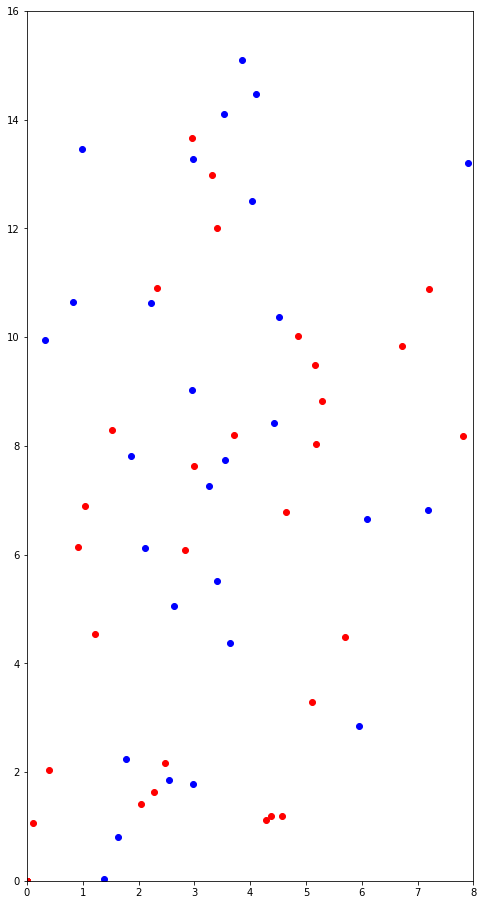

In [5]:
figura = plt.figure(figsize=(8,16))
assi = plt.axes(xlim=(0,8), ylim=(0,16))
linea = assi.plot([], [], 'bo')[0]
linea2 = assi.plot([], [], 'ro')[0]

DisegnaAnimazione = animation.FuncAnimation(figura,                   # Figura da disegnare
                                            animazione,               # chiamata a funzione
                                            frames = campioniPerdt,   # Tempo per chiamare la funzione
                                            interval = 90)
HTML(DisegnaAnimazione.to_html5_video())

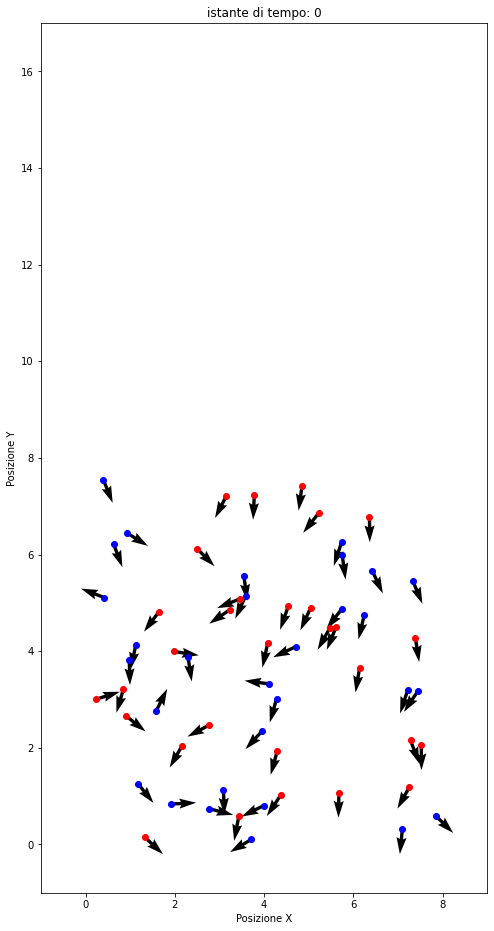

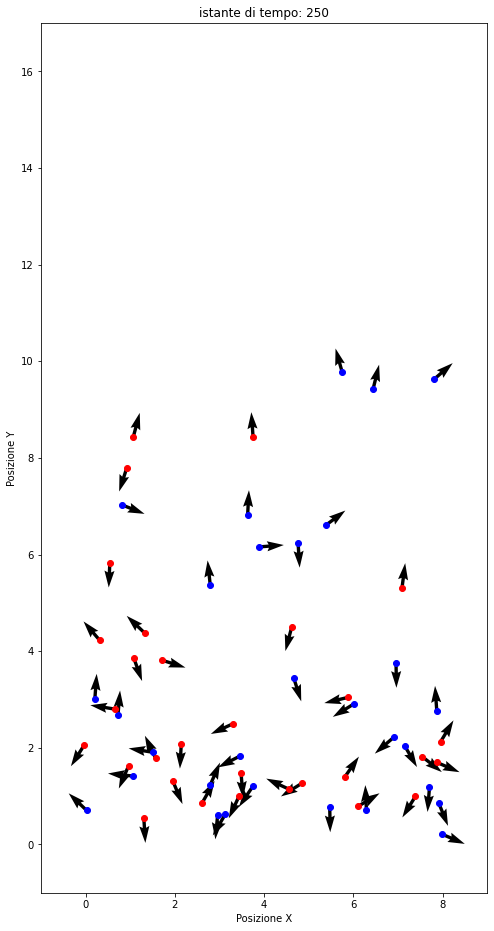

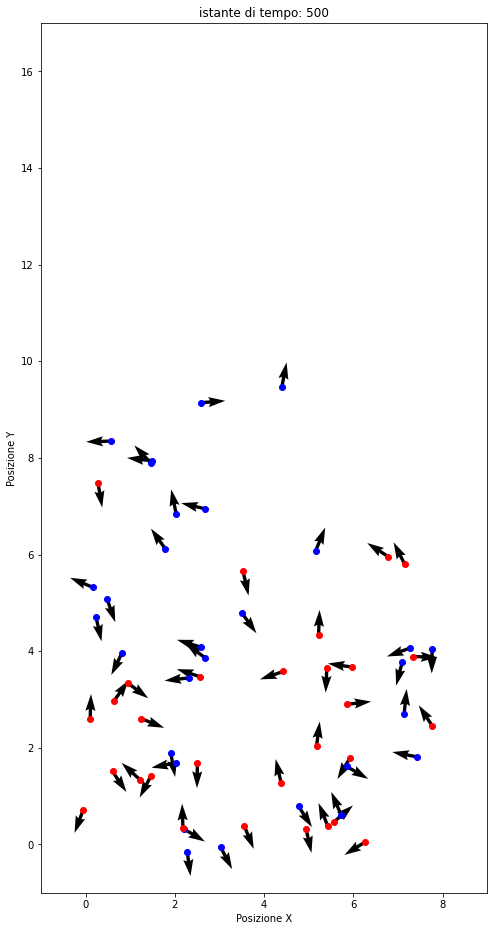

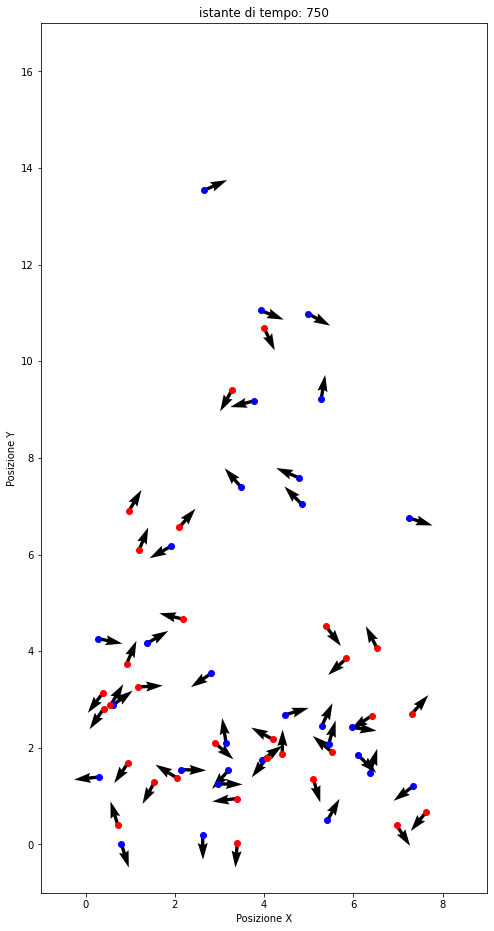

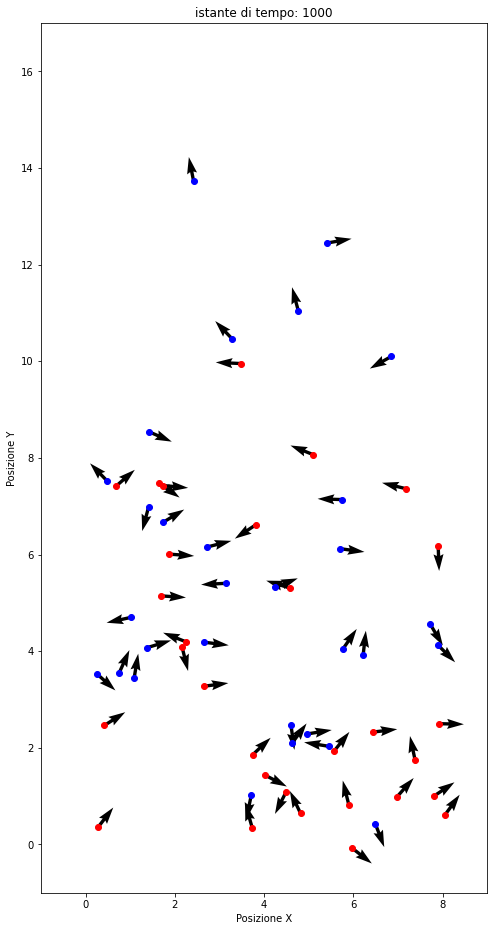

...

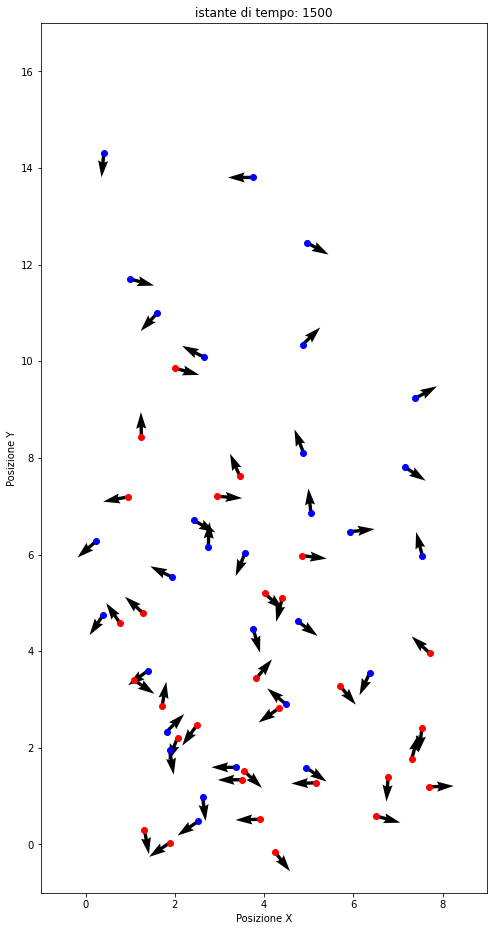

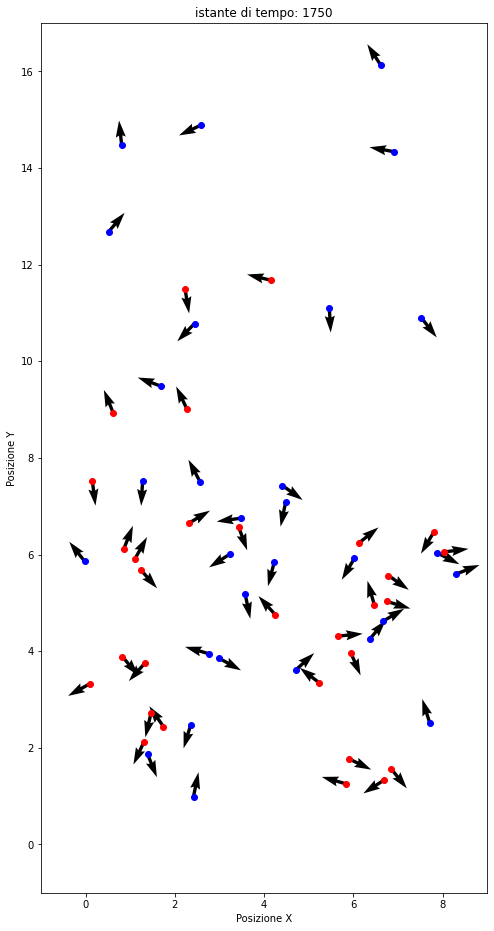

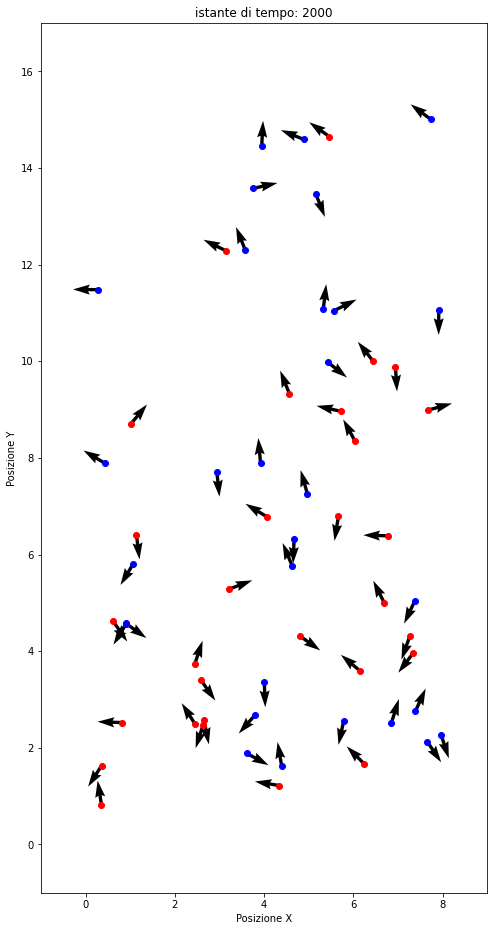

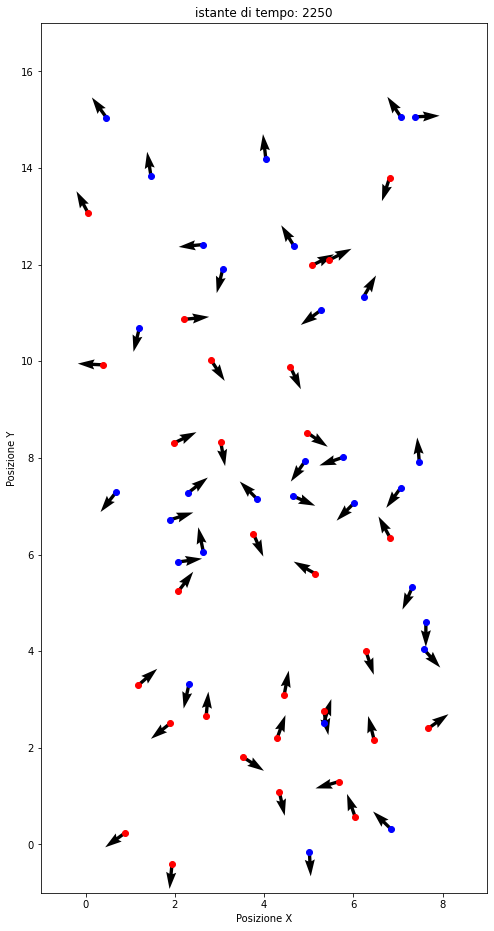

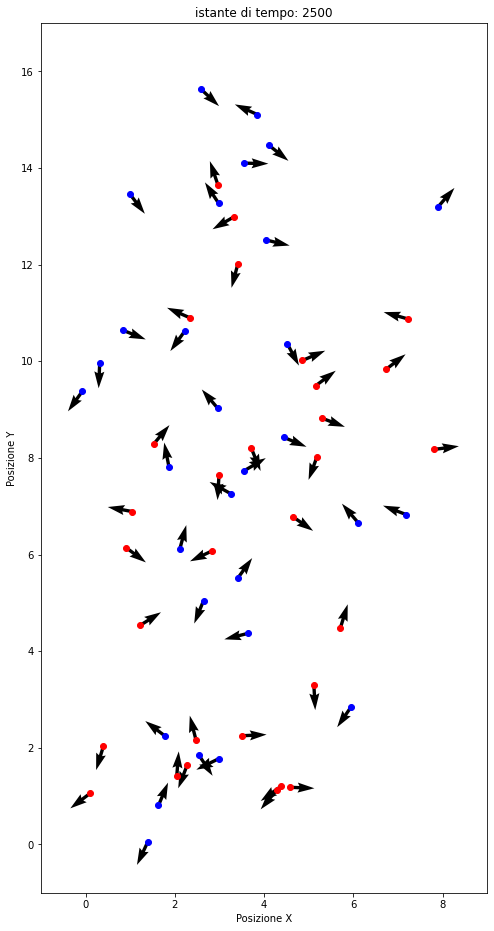

In [6]:
#stampa di tutte le particelle con relativi vettori velocità in 10 istanti di tempo
DisegnaTutteParticelleIstanti(particelleA1, particelleB1)

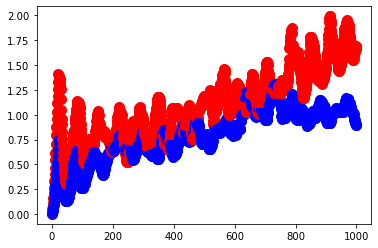

In [7]:
# Calcolo dell'energia cinetica di tutte le particelleA in ogni istante di tempo
for pa in particelleA1:
    for t in range(0, 1000):
        pa[t][5] = EnergiaCinetica(pa[t][2], pa[t][3], massaPartA)
        
# Calcolo dell'energia cinetica di tutte le particelleB in ogni istante di tempo
for pb in particelleB1:
    for t in range(0, 1000):
        pb[t][5] = EnergiaCinetica(pb[t][2], pb[t][3], massaPartB)

# funzione per il calcolo della somma di tutte le energie cinetiche 
def sommatoriaCinetica (particelle, k):
    somma = 0
    for i in range(0, len(particelle)):
        somma += particelle[i][k][5]
    return somma

# inizializzazione degli array per calcolare l'energia cinetica media ad ogni istante di tempo
cineticaMediaB = np.zeros(1000)
cineticaMediaA = np.zeros(1000)
for t in range(0, 1000):
    cineticaMediaA[t] = sommatoriaCinetica(particelleA1, t) / numeroPartA
    cineticaMediaB[t] = sommatoriaCinetica(particelleB1, t) / numeroPartB
    plt.plot(t, cineticaMediaA[t],'-bo', marker='o', markersize=10) 
    plt.plot(t, cineticaMediaB[t],'-r', marker='o', markersize=10)
plt.show()

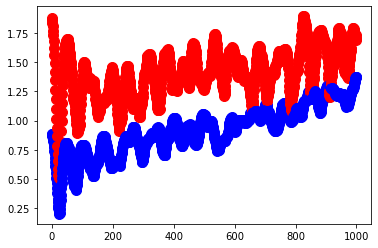

In [8]:
# Calcolo dell'energia potenziale di tutte le particelleA in ogni istante di tempo
for pa in particelleA1:
    for t in range(0, 1000):
        pa[t][6] = EnergiaPotenziale(pa[t][1], massaPartA)
            
# Calcolo dell'energia potenziale di tutte le particelleB in ogni istante di tempo
for pb in particelleB1:
    for t in range(0, 1000):
        pb[t][6] = EnergiaPotenziale(pb[t][1], massaPartB)

# funzione per il calcolo della somma di tutte le energie potenziali 
def sommatoriaPotenziale (particelle, k):
    somma = 0
    for i in range(0, len(particelle)):
        somma += particelle[i][k][6]
    return somma

# inizializzazione degli array per calcolare l'energia potenziale media ad ogni istante di tempo
PotenzialeMediaB = np.zeros(1000)
PotenzialeMediaA = np.zeros(1000)
for t in range(0, 1000):
    PotenzialeMediaA[t] = sommatoriaPotenziale(particelleA1, t) / numeroPartA
    PotenzialeMediaB[t] = sommatoriaPotenziale(particelleB1, t) / numeroPartB
    plt.plot(t, PotenzialeMediaA[t],'-bo', marker='o', markersize=10) 
    plt.plot(t, PotenzialeMediaB[t],'-r', marker='o', markersize=10)
plt.show()

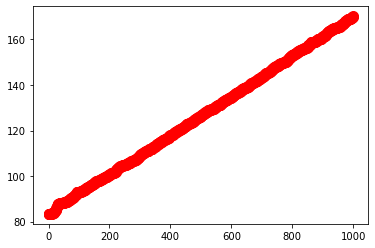

In [9]:
# inizializzazione degli array per calcolare l'energia meccanica media ad ogni istante di tempo
MeccanicaMediaA = np.zeros(1000)

for t in range(0, 1000):
    MeccanicaMediaA[t] = numeroPartA * (cineticaMediaA[t] + PotenzialeMediaA[t]) + numeroPartB * (cineticaMediaB[t] + PotenzialeMediaB[t]) 

    plt.plot(t, MeccanicaMediaA[t],'-r', marker='o', markersize=10) 
plt.show()

In [10]:
# funzione per avanzare di un passo temporale, rifaccio tutti i controlli delle collisioni come 
# si vede nella funzione precedente
def PassoTemporale(particellaA, particellaB, massaA, massaB, k, dt):    
    # Shift di tutte le misurazioni delle particelle A dal tempo t-1 al tempo t
    for pa in particellaA:
        pa[k] = pa[k-1]
            
    # Shift di tutte le misurazioni delle particelle B dal tempo t-1 al tempo t
    for pb in particellaB:
        pb[k] = pb[k-1]
        
    for n1 in range(0, numeroPartA):
        for n2 in range(0, numeroPartA):
            if (DistanzaParticelle(particellaA[n1], particellaA[n2], k) <= (raggioPart * 2) and n1 != n2):

                Rrelx = particellaA[n1][k][0] - particellaA[n2][k][0] 
                Rrely = particellaA[n1][k][1] - particellaA[n2][k][1]
                Vrelx = particellaA[n1][k][2] - particellaA[n2][k][2]
                Vrely = particellaA[n1][k][3] - particellaA[n2][k][3]
                c = ((Vrelx * Rrelx) + (Vrely * Rrely)) / ((Rrelx** 2 )+ (Rrely ** 2 ))
                
                particellaA[n1][k][2] = particellaA[n1][k][2] - (c * Rrelx)
                particellaA[n1][k][3] = particellaA[n1][k][3] - (c * Rrely)
                particellaA[n2][k][2] = particellaA[n2][k][2] + (c * Rrelx)
                particellaA[n2][k][3] = particellaA[n2][k][3] + (c * Rrely)
            
    for pa in particellaA:
        for pb in particellaB:

            if (DistanzaParticelle(pa, pb, k) <= (raggioPart * 2)):
                Rrelx = pa[k][0] - pb[k][0] 
                Rrely = pa[k][1] - pb[k][1]
                Vrelx = pa[k][2] - pb[k][2]
                Vrely = pa[k][3] - pb[k][3]
                c = ((Vrelx * Rrelx) + (Vrely * Rrely)) / ((Rrelx** 2 )+ (Rrely ** 2 ))
                
                pa[k][2] = pa[k][2] - (2 * massaPartB / (massaPartB + massaPartA)) * (c * Rrelx)
                pa[k][3] = pa[k][3] - (2 * massaPartB / (massaPartB + massaPartA)) * (c * Rrely)
                pb[k][2] = pb[k][2] + (2 * massaPartA / (massaPartB + massaPartA)) * (c * Rrelx)
                pb[k][3] = pb[k][3] + (2 * massaPartA / (massaPartB + massaPartA)) * (c * Rrely)
                
    for p1 in range(0, numeroPartB):
        for p2 in range(0, numeroPartB):
            if (DistanzaParticelle(particellaB[p1], particellaB[p2], k) <= (raggioPart * 2) and p1 != p2):
                Rrelx = particellaB[p1][k][0] - particellaB[p2][k][0] 
                Rrely = particellaB[p1][k][1] - particellaB[p2][k][1]
                Vrelx = particellaB[p1][k][2] - particellaB[p2][k][2]
                Vrely = particellaB[p1][k][3] - particellaB[p2][k][3]
                c = ((Vrelx * Rrelx) + (Vrely * Rrely)) / ((Rrelx** 2 )+ (Rrely ** 2 ))
                
                particellaB[p1][k][2] = particellaB[p1][k][2] - (c * Rrelx)
                particellaB[p1][k][3] = particellaB[p1][k][3] - (c * Rrely)
                particellaB[p2][k][2] = particellaB[p2][k][2] + (c * Rrelx)
                particellaB[p2][k][3] = particellaB[p2][k][3] + (c * Rrely)            
    
    for pa in particellaA:      
        if ((pa[k][0] - raggioPart) <= 0):
            pa[k][2] = - pa[k][2] 
            pa[k][0] = 0 + raggioPart
            

        if ((pa[k][0] + raggioPart) >= dimBoxX):
            pa[k][2] = - pa[k][2]
            pa[k][0] = dimBoxX - raggioPart


        if ((pa[k][1]) - raggioPart <= 0):
            pa[k][3] = - pa[k][3]
            pa[k][1] = 0 + raggioPart
            
            
        if ((pa[k][1]) + raggioPart >= dimBoxY): 
            pa[k][3] = - pa[k][3]
            pa[k][1] = dimBoxY - raggioPart
            
        pa[k][0] = pa[k][0] + pa[k][2] * dt                    
        pa[k][1] = pa[k][1] + (pa[k][3] * dt) - (gravita * dt**2)/2   
        pa[k][3] = pa[k][3] - (gravita * dt)
        pa[k][5] = EnergiaCinetica(pa[k][2], pa[k][3], massaA)  
        pa[k][6] = EnergiaPotenziale(pa[k][1], massaA)          

    for pb in particellaB:
        if ((pb[k][0] - raggioPart) <= 0):
            
            pb[k][2] = - pb[k][2] 
            pb[k][0] = 0 + raggioPart
            
        if ((pb[k][0] + raggioPart) >= dimBoxX):
            
            pb[k][2] = - pb[k][2] 
            pb[k][0] = dimBoxX - raggioPart


        if ((pb[k][1]) - raggioPart <= 0):
            
            pb[k][3] = - pb[k][3] 
            pb[k][1] = 0 + raggioPart
            
        if ((pb[k][1]) + raggioPart >= dimBoxY): 
           
            pb[k][3] = - pb[k][3] 
            pb[k][1] = dimBoxY - raggioPart
            
        
        pb[k][0] = pb[k][0] + pb[k][2] * dt                        
        pb[k][1] = pb[k][1] + (pb[k][3] * dt) - (gravita * dt**2)/2  
        pb[k][3] = pb[k][3] - (gravita * dt)
        pb[k][5] = EnergiaCinetica(pb[k][2], pb[k][3], massaB)     
        pb[k][6] = EnergiaPotenziale(pb[k][1], massaB)              

# funzione per fara la simulazione
def simula (dt, numPassi, partA, partB):
    #inizializzazione
    for i in range(numeroPartA): # ripeti per il numero di particelle di tipo A
        partA[i][0][0] = generatoreNumCas(raggioPart, dimBoxX - raggioPart);            # posizione x
        partA[i][0][1] = generatoreNumCas(raggioPart, dimBoxY/2);                       # posizione y
        partA[i][0][2] = generatoreNumCas(intervalloVel[0], intervalloVel[1]);          # componente x velocità
        partA[i][0][3] = generatoreNumCas(intervalloVel[0], intervalloVel[1]);          # componente y velocità
        partA[i][0][4] = velocita(partA[i][0][2], partA[i][0][3]);   # Velocità relativa data dal teorema di Pitagora
        partA[i][0][5] = EnergiaCinetica(partA[i][0][2], partA[i][0][3], massaPartA);   # Energia cinetica 
        partA[i][0][6] = EnergiaPotenziale(partA[i][0][1], massaPartA);                 # Energia Potenziale
        
    for i in range(numeroPartB): # ripeti per il numero di particelle di tipo B
        partB[i][0][0] = generatoreNumCas(raggioPart, dimBoxX - raggioPart);            # posizione x
        partB[i][0][1] = generatoreNumCas(raggioPart, dimBoxY/2);                       # posizione y
        partB[i][0][2] = generatoreNumCas(intervalloVel[0], intervalloVel[1]);          # componente x velocità
        partB[i][0][3] = generatoreNumCas(intervalloVel[0], intervalloVel[1]);          # componente y velocità
        partB[i][0][4] = velocita(partB[i][0][2], partB[i][0][3]);   # Velocità relativa data dal teorema di Pitagora
        partB[i][0][5] = EnergiaCinetica(partB[i][0][2], partB[i][0][3], massaPartB);   # Energia cinetica 
        partB[i][0][6] = EnergiaPotenziale(partB[i][0][1], massaPartB);                 # Energia Potenziale
        
    for l in range(1, numPassi):
        PassoTemporale(partA, partB, massaPartA, massaPartB, l, dt)

def calcoloPlot(particelleA, particelleB, campPerdt):
    for pa in particelleA:
        for t in range(0, campPerdt):
            pa[t][5] = EnergiaCinetica(pa[t][2], pa[t][3], massaPartA)
        

    for pb in particelleB:
        for t in range(0, campPerdt):
            pb[t][5] = EnergiaCinetica(pb[t][2], pb[t][3], massaPartB)

    cineticaMediaB = np.zeros(campPerdt)
    cineticaMediaA = np.zeros(campPerdt)
    for t in range(0, campioniPerdt):
        cineticaMediaA[t] = sommatoriaCinetica(particelleA, t) / numeroPartA
        cineticaMediaB[t] = sommatoriaCinetica(particelleB, t) / numeroPartB

    for pa in particelleA:
        for t in range(0, campPerdt):
            pa[t][6] = EnergiaPotenziale(pa[t][1], massaPartA)

    for pb in particelleB:
        for t in range(0, campPerdt):
            pb[t][6] = EnergiaPotenziale(pb[t][1], massaPartB)

    PotenzialeMediaB = np.zeros(campPerdt)
    PotenzialeMediaA = np.zeros(campPerdt)

    for t in range(0, campPerdt):
        PotenzialeMediaA[t] = sommatoriaPotenziale(particelleA, t) / numeroPartA
        PotenzialeMediaB[t] = sommatoriaPotenziale(particelleB, t) / numeroPartB

    MeccanicaMediaA = np.zeros(campPerdt)

    for t in range(0, campPerdt):
        MeccanicaMediaA[t] = numeroPartA * (cineticaMediaA[t] + PotenzialeMediaA[t]) + numeroPartB * (cineticaMediaB[t] + PotenzialeMediaB[t]) 
        plt.plot(t, MeccanicaMediaA[t],'-r', marker='o', markersize=10) 
    plt.show()

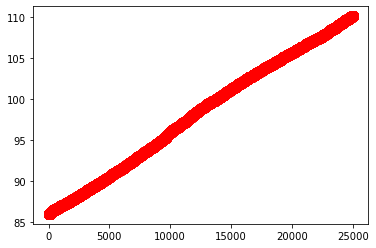

In [11]:
#simulazione 2
#25000 passi

#inizializzazione array particelle
particelleA2 = np.zeros((numeroPartA ,25000,7),'d');
particelleB2 = np.zeros((numeroPartB ,25000,7),'d');

#definizione del dt
dti = 0.004
campioniPerdt = int(T / dti)
simula(dti, campioniPerdt, particelleA2, particelleB2)
calcoloPlot(particelleA2, particelleB2, campioniPerdt)

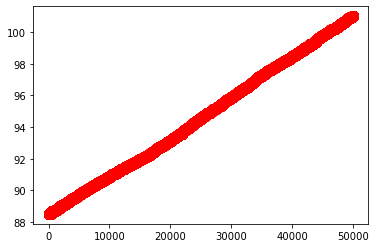

In [12]:
#simulazione 3
#50000 passi

#inizializzazione array particelle
particelleA3 = np.zeros((numeroPartA ,50000,7),'d');
particelleB3 = np.zeros((numeroPartB ,50000,7),'d');

#definizione del dt
dti = 0.002
campioniPerdt = int(T / dti)
simula(dti, campioniPerdt, particelleA3, particelleB3)
calcoloPlot(particelleA3, particelleB3, campioniPerdt)

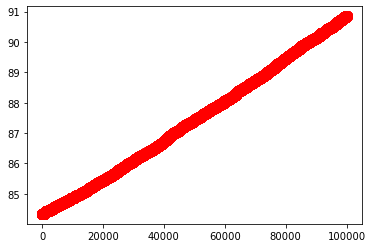

In [13]:
#simulazione 4
#100000 passi

#inizializzazione array particelle
particelleA4 = np.zeros((numeroPartA ,100000,7),'d');
particelleB4 = np.zeros((numeroPartB ,100000,7),'d');

#definizione del dt
dti = 0.001
campioniPerdt = int(T / dti)
simula(dti, campioniPerdt, particelleA4, particelleB4)
calcoloPlot(particelleA4, particelleB4, campioniPerdt)